# Objective:

### In this file, we will understand how to create a conversational language understanding project in Azure Language Studio, and how can we make calls to the project using Python SDK.

### Please note, we are going to create the project in the Studio, because Azure does not support creation of CLU project using SDK for now.

# Prerequisites:

# 1. Install the necessary libraries:

In [ ]:
# language conversations libraries
!pip install azure-ai-language-conversations --pre

# dotenv library
!pip install python-dotenv

 ## 2. Import the required libraries:

In [ ]:
from IPython.display import Image as img

In [ ]:
# To read the secret keys for Authentication
import os
from dotenv import load_dotenv
from azure.core.credentials import AzureKeyCredential

# To
from azure.ai.language.conversations import ConversationAnalysisClient

# Importing library to view image
from IPython.display import Image as img

## 3. Create a Language resource in your resource group (Azure Portal). You can skip these steps if you have a Language Service resource already present in your Azure Portal. [Click here](https://colab.research.google.com/drive/1EXOk98KxUh2rO5d2QDUxm5hdgaX71X43#scrollTo=vxvWlS_jIjDH&line=2&uniqifier=1) to skip this section.

## Go to your resource group in Azure Portal https://portal.azure.com/
### Create new language service resource.
### Select both options for your language resource:
 > ### 1. Custom Question Answering  
 >### 2. Custom text classification etc.





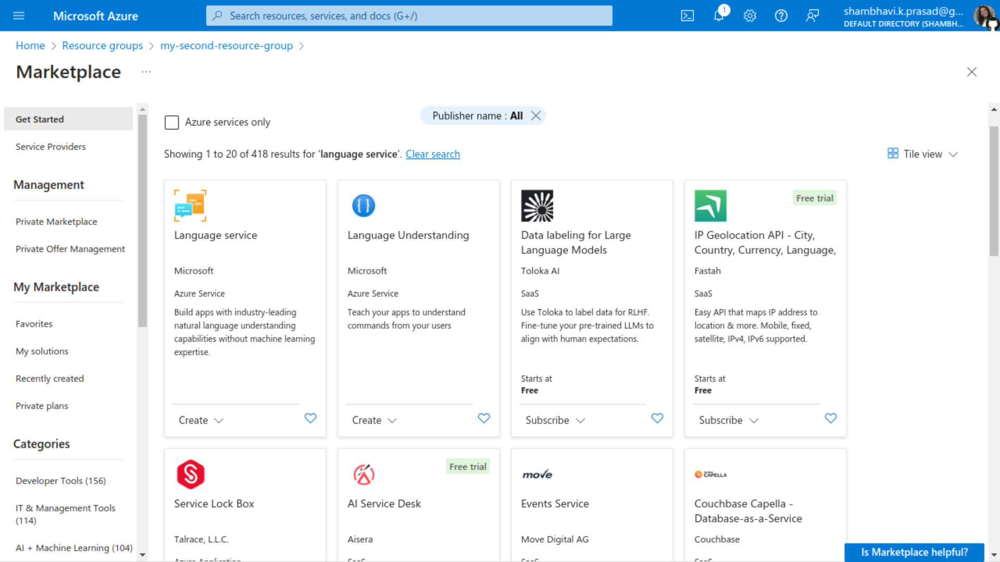

In [ ]:
img('clu01.png')

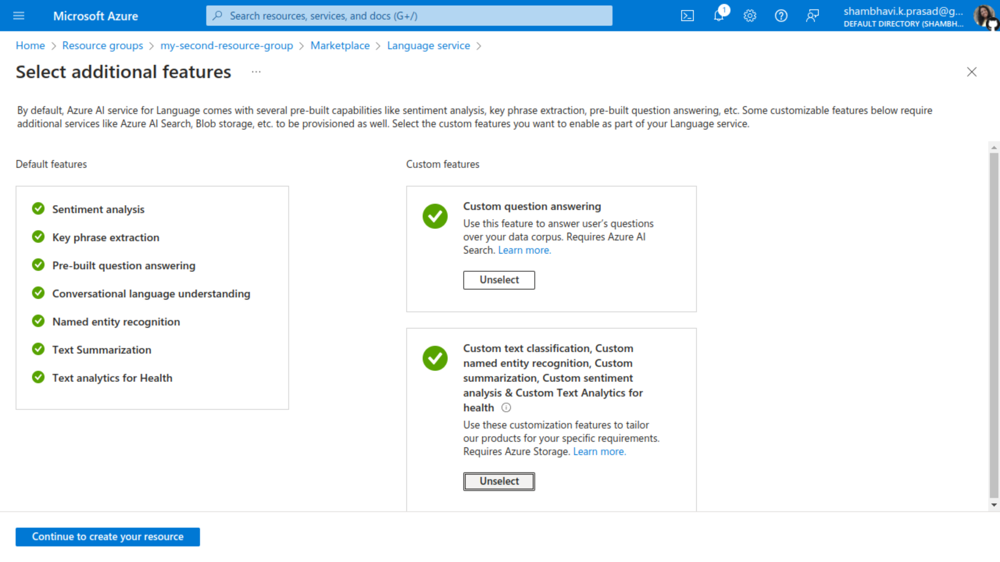

In [ ]:
img('clu02.png')

>  
> ### Please select the free pricing tier for your resource.
> ### Please select the Premium LRS for your storage account.

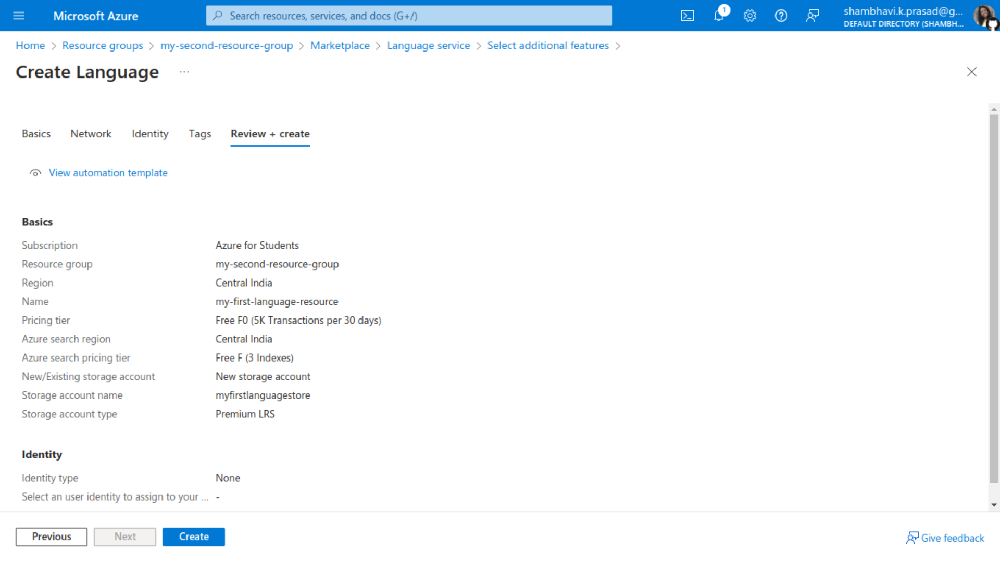

In [ ]:
img('clu05.png')

## After executing the above steps, you will see three resources in your resource group:


### 1.   Language resource
### 2.   Storage resource
### 3.   Search resource



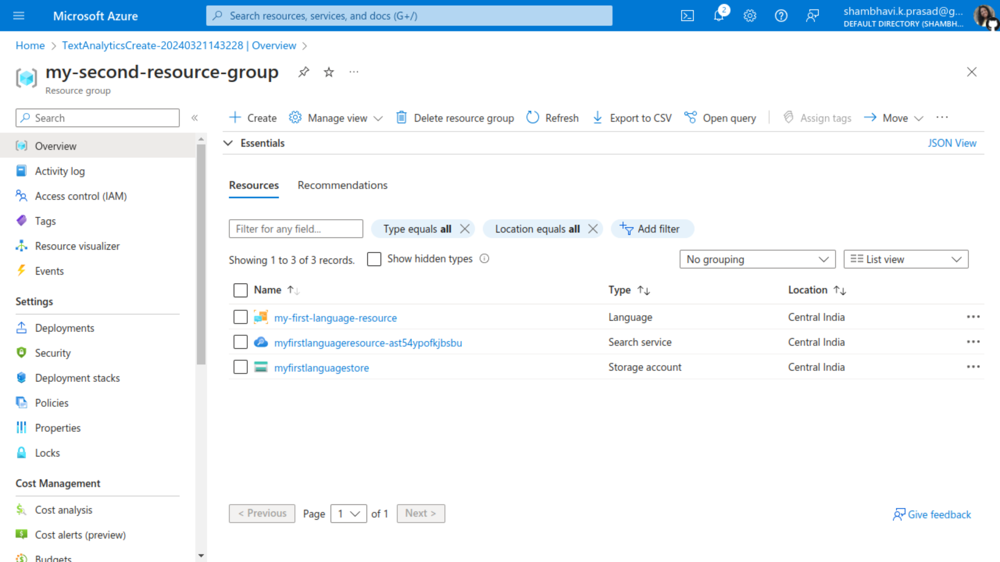

In [ ]:
img('clu06.png')

## Environment Variables:
### Copy the subscription key and endpoint. Save them as environment variables, to authenticate and connect to the Language Service client.

### How to save the keys as environment variables?
  1. Open a new instance of a word editor like Notepad.
  2. Enter the names of your variables (subscription_key and endpoint) and save their values as strings.
  3. Name the file as .env. Please note, this file will be hidden. To view it, kindly select the option to show hidden files.
  4. For reference, here is a screenshot of an env file.
  5. Import the file in your IDE, and read the values. For future runs, you will need to update this file with new values for subscription key and endpoint.



In [ ]:
img('env_sample1.png')

## Case Study

## Step 1: Select Conversational Language Understanding from the home page of Language Studio.

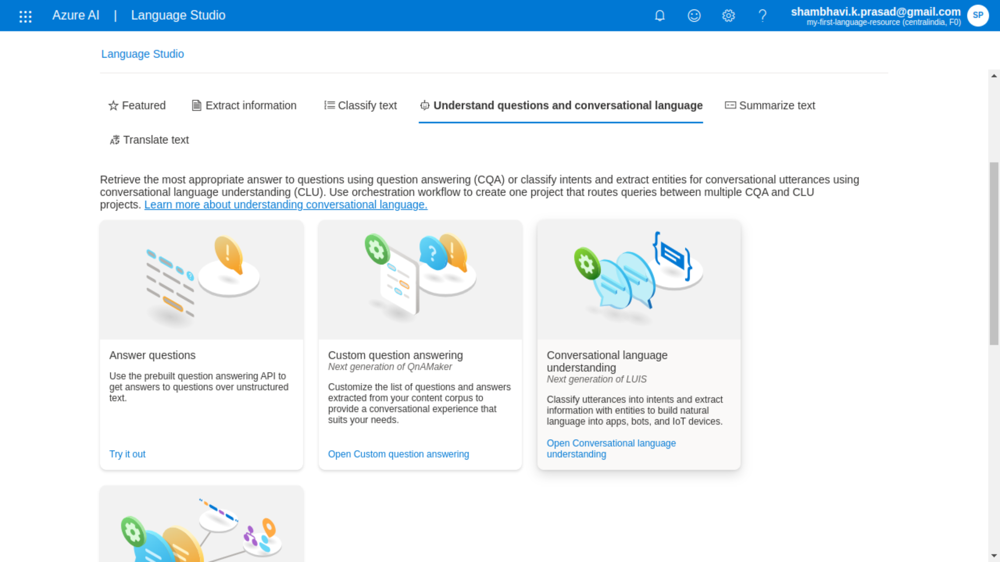

In [ ]:
img('clu1.png')

## You can choose to either

1.   Create a new project
2.   Import an existing project.

For the purposes of this session, we will import an existing project. The project is related to the automation of devices and appliances at home. We can ask the system to turn the devices on or off, and we can also ask about the status of the devices, whether they are on or off



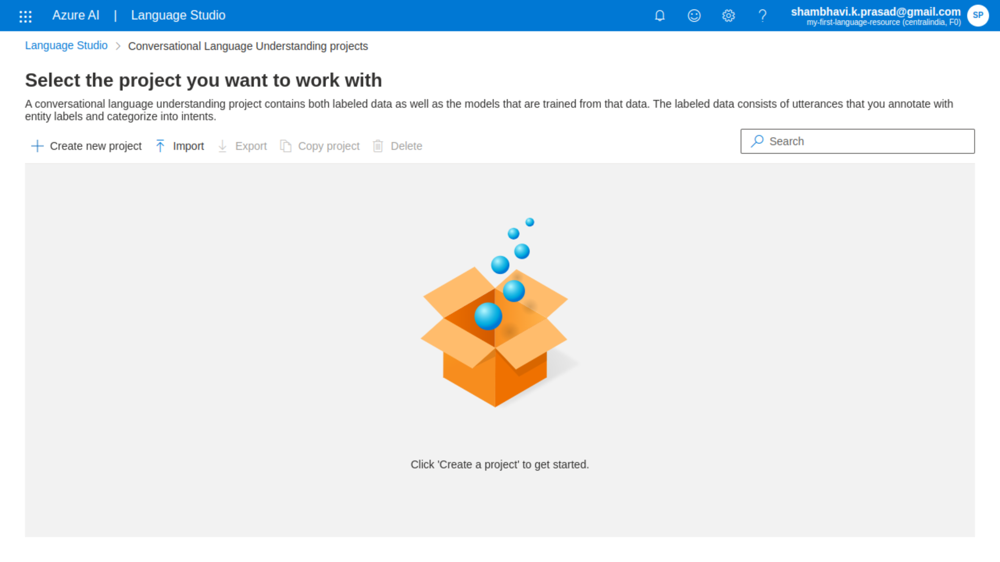

In [ ]:
img('clu2.png')

## Import the HomeAutomationDemo.json file to create a new project.  Here is the standard json format for a project:
```
{
  "projectFileVersion": "2022-10-01-preview",
  "stringIndexType": "Utf16CodeUnit",
  "metadata": {
    "projectKind": "Conversation",
    "projectName": "{PROJECT-NAME}",
    "multilingual": true,
    "description": "DESCRIPTION",
    "language": "{LANGUAGE-CODE}",
    "settings": {
            "confidenceThreshold": 0
        }
  },
  "assets": {
    "projectKind": "Conversation",
    "intents": [
      {
        "category": "intent1"
      }
    ],
    "entities": [
      {
        "category": "entity1",
        "compositionSetting": "{COMPOSITION-SETTING}",
        "list": {
          "sublists": [
            {
              "listKey": "list1",
              "synonyms": [
                {
                  "language": "{LANGUAGE-CODE}",
                  "values": [
                    "{VALUES-FOR-LIST}"
                  ]
                }
              ]
            }            
          ]
        },
        "prebuilts": [
          {
            "category": "{PREBUILT-COMPONENTS}"
          }
        ],
        "regex": {
          "expressions": [
              {
                  "regexKey": "regex1",
                  "language": "{LANGUAGE-CODE}",
                  "regexPattern": "{REGEX-PATTERN}"
              }
          ]
        },
        "requiredComponents": [
            "{REQUIRED-COMPONENTS}"
        ]
      }
    ],
    "utterances": [
      {
        "text": "utterance1",
        "intent": "intent1",
        "language": "{LANGUAGE-CODE}",
        "dataset": "{DATASET}",
        "entities": [
          {
            "category": "ENTITY1",
            "offset": 6,
            "length": 4
          }
        ]
      }
    ]
  }
}
```

Reference: https://learn.microsoft.com/en-us/azure/ai-services/language-service/conversational-language-understanding/concepts/data-formats

## In simple terms, the project file can be divided in four parts:
1. Project settings.
2. Intents.
3. Entitites.
4. Utterances.

## In our input file, we can see these building blocks as well:
### 1. Project settings:
```
 "projectFileVersion": "2022-05-01",
    "stringIndexType": "Utf16CodeUnit",
    "metadata": {
        "projectKind": "Conversation",
        "settings": {
            "confidenceThreshold": 0.5
        },
        "projectName": "HomeAutomationAppDemo",
        "multilingual": false,
        "description": "",
        "language": "en-us"
    }
```

> * This specifies that the project was created on 01-05-2022, it is a conversation, and the confidence threshold is 0.5 (The value of the confidenceThreshold can range from 0 to 1). This means that intent predicted below 0.5 will be classified as None intent. You can learn more about the None intent [here](https://learn.microsoft.com/en-us/azure/ai-services/language-service/conversational-language-understanding/concepts/none-intent).
>* The name of our project is HomeAutomationAppDemo. In the Studio, you can rename the project as per your requirement.
* Finally, there is a boolean flag called multilingual, which specifies if the project supports utterances in mutliple languages. In this case, we have utterances in one language only, specified as "en-us"

### 2. Intents:
```
"intents": [
            {
                "category": "HomeAutomation.TurnOff"
            },
            {
                "category": "HomeAutomation.TurnOn"
            },
            {
                "category": "None"
            }
        ]
```

> We have three intents in our project:
  1.   HomeAutomation.TurnOff
  2.   HomeAutomation.TurnOn
  3.   None


### 3. Entities
```
"entities": [
                {
                    "category": "HomeAutomation.Location",
                    "compositionSetting": "combineComponents"
                },
                {
                    "category": "HomeAutomation.DeviceName",
                    "compositionSetting": "combineComponents",
                    "list": {
                        "sublists": [....]
                    }
                },
                {
                    "category": "HomeAutomation.DeviceType",
                    "compositionSetting": "combineComponents",
                    "list": {
                        "sublists": [....]
                    }
                }
            ]
```

> We have three entitites in our project:
1. HomeAutomation.Location
2. HomeAutomation.DeviceName
3. HomeAutomation.DeviceType <br><br>
 Please note that the options of prebuilt, regex and requiredComponents under Entities is completely optional, and are not defined in our json file.

### 4. Utterances:

```
"utterances": [

            {
                "text": "adjust family room lights to 15 %",
                "intent": "None",
                "entities": [
                    {
                        "category": "HomeAutomation.Location",
                        "offset": 7,
                        "length": 11
                    }
                ]
            },
            ....
            ]
```

>We have many utterances in our file. There are two things labelled in each utterance:
  1. Intent : Can be one of the three defined above (HomeAutomation.TurnOff, HomeAutomation.TurnOn, None). In the given example, our text reads : "adjust family room lights to 15 %". This has been categorised as a None intent, as it does not ask for the device to be turned on or off. <br>
  2. Entities: Can be one of the three defined above (HomeAutomation.Location,
HomeAutomation.DeviceName, HomeAutomation.DeviceType). In this file, we have defined only one entity, namely, HomeAutomation.Location. The offset specifies the start of the character (inclusive) and length specifies how long the entity is in the given utterance. Another example of an utterance is as follows:

```
    {
                "text": "all lights on for 1 hour",
                "intent": "HomeAutomation.TurnOn",
                "entities": []
    }
```

  >Here, we have not defined any entities, only the intent. This will hamper model performance in terms of entities. As an improvement, you are encouraged to define more entities in the json file. Another way to define entities will be demonstrated subsequently.

## Import the HomeAutomationDemo.json file in your Language Studio to create new project.

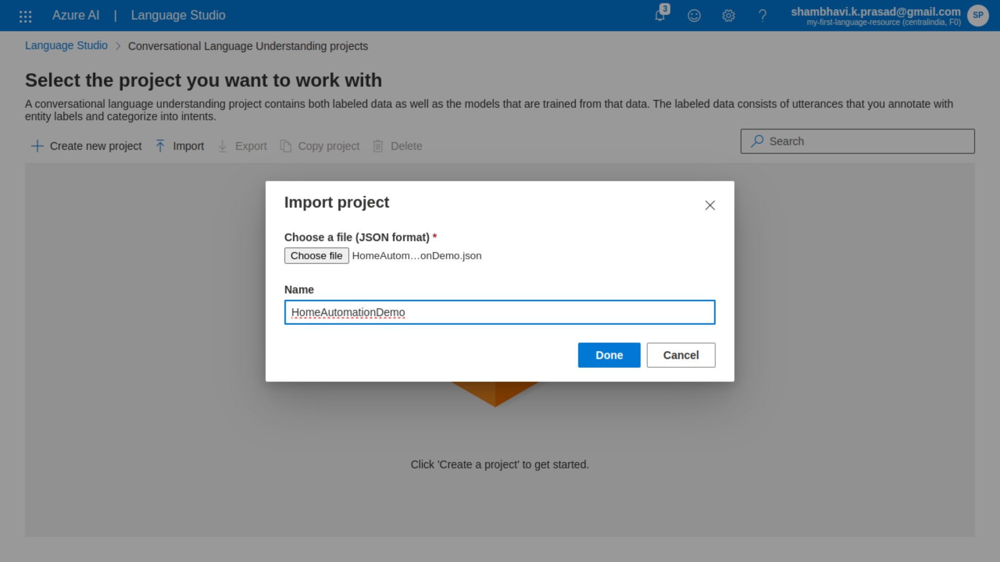

In [ ]:
img('clu4.png')

## Once the import is successful, you can see the schema definition. This will show you the intents, entities, and the count of labelled utterances against each. We can also see the entities associated with each of the intents. Similarly, looking at the entities, we can see which intents they are linked to.

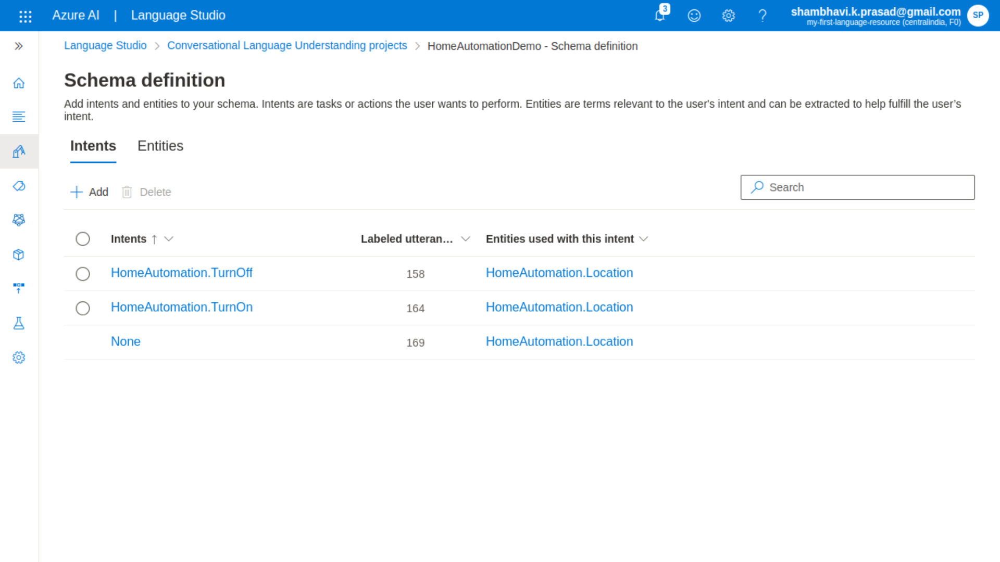

In [ ]:
img('clu5.png')

## Here, we can see that only the HomeAutomation.Location entity is used in all the utterances. It is  also the only entity associated with all intents.

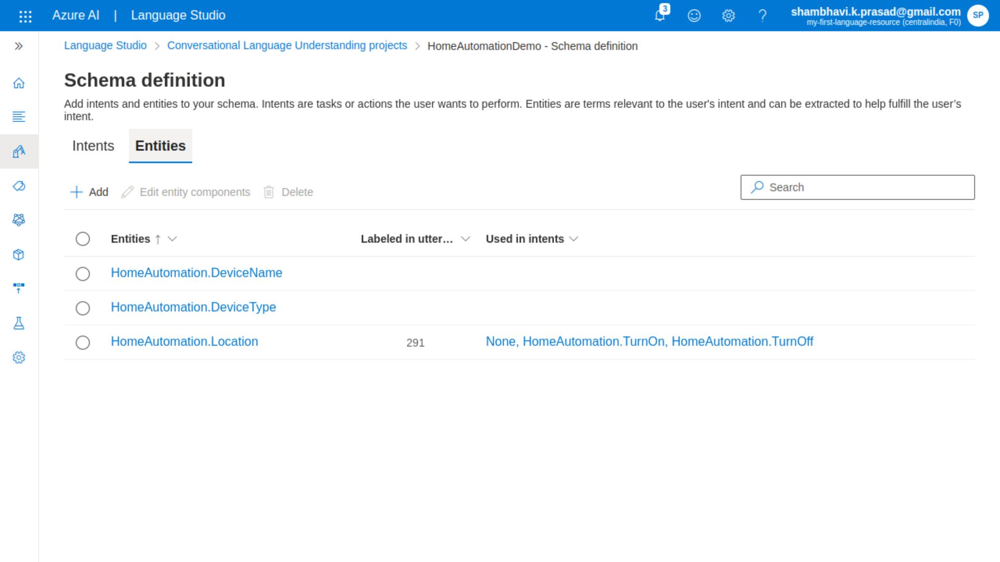

In [ ]:
img('clu6.png')

## By clicking on the Data Labelling tab, we can see which entities are associated with the utterances. The entities are underlined in blue. Hovering over them will show the entity category.

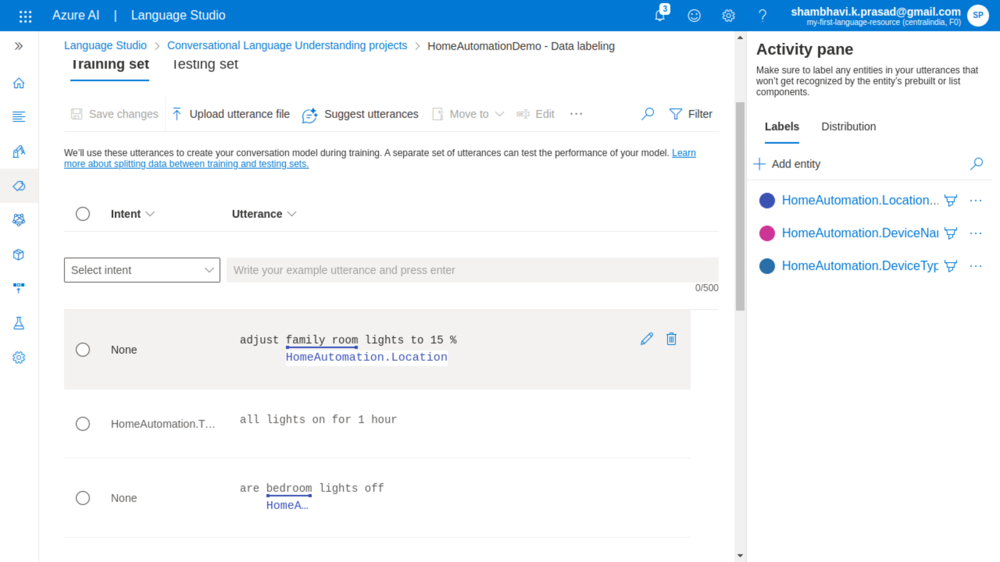

In [ ]:
img('clu7.png')

## You can also label more entities by highlighting it and then selecting the relevant category.

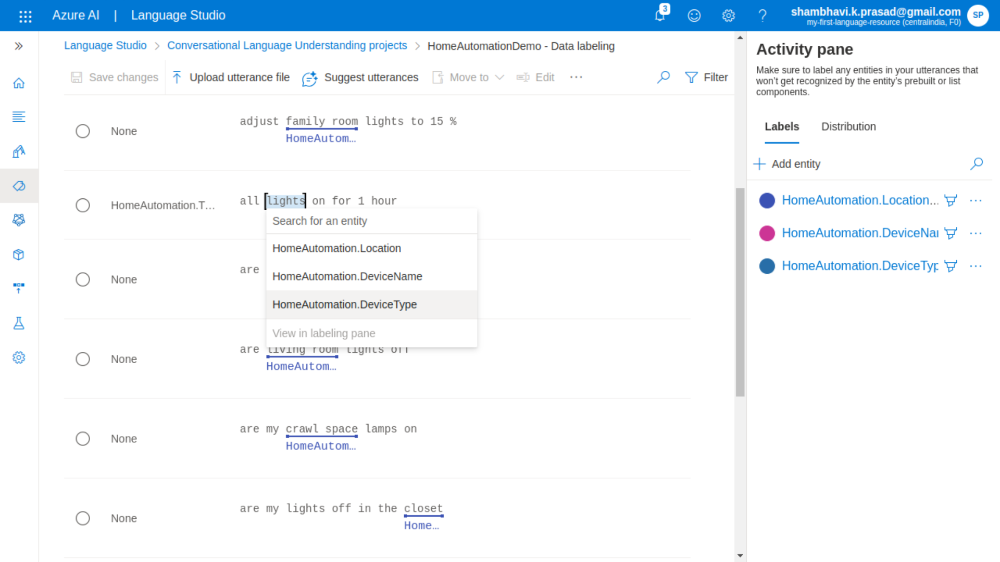

In [ ]:
img('clu8.png')

## Once you are satisfied with the labelling, submit your job for training by clicking on the Training jobs tab.

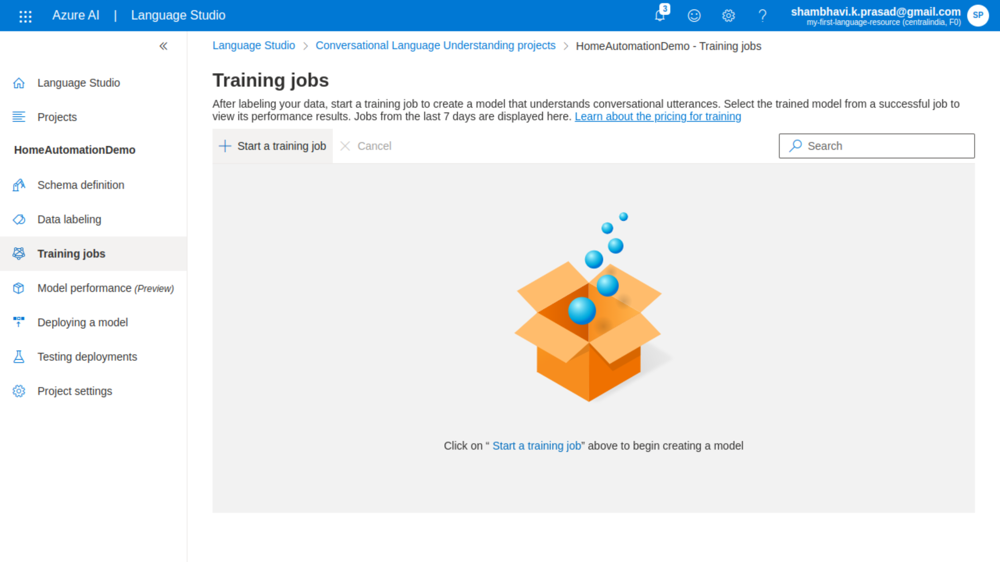

In [ ]:
img('clu9.png')

 ## Start a training job. Enter the model name, and select standard training (free). Select default splitting (80%  training and 20% testing set) and submit the job for training.

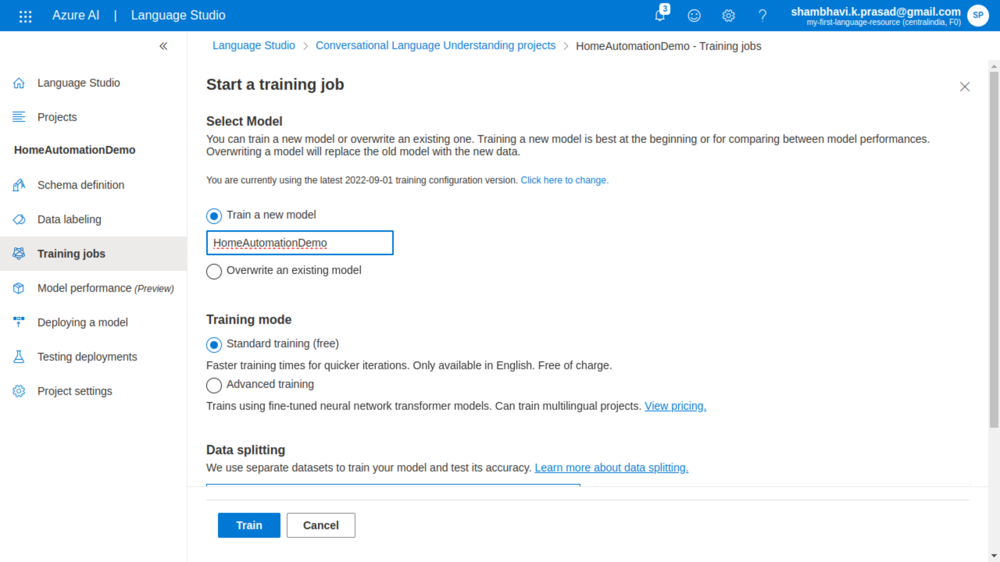

In [ ]:
img('clu10.png')

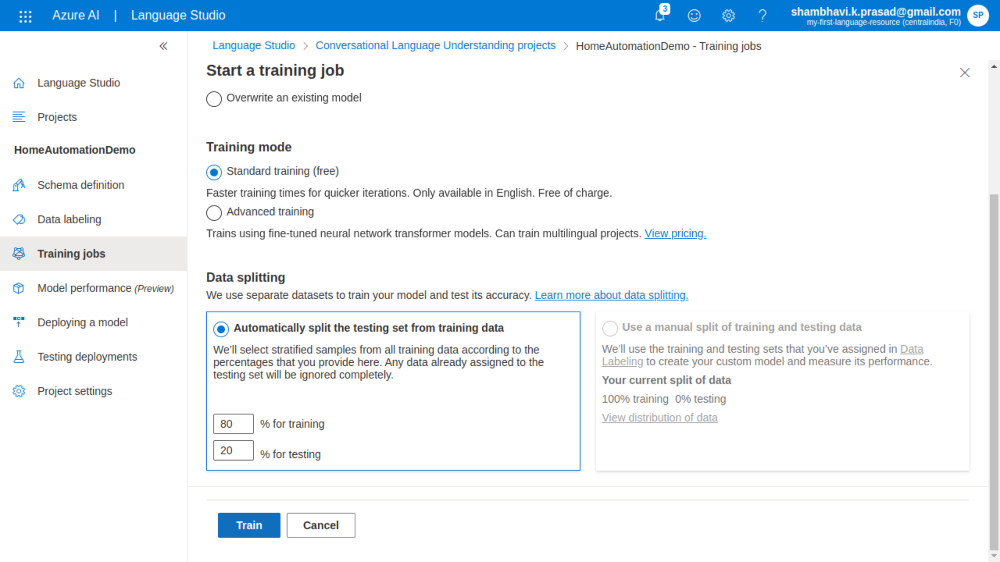

In [ ]:
img('clu11.png')

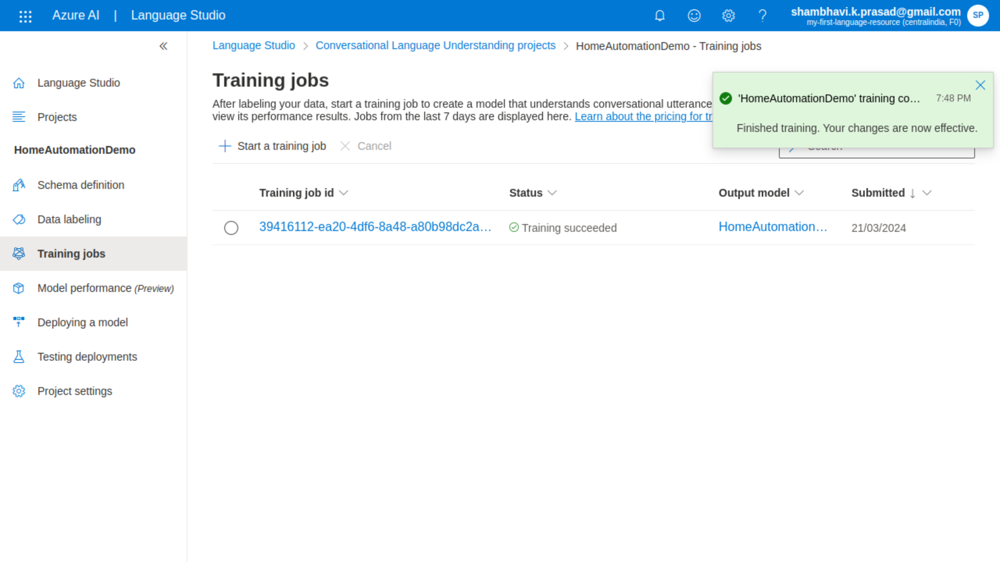

In [ ]:
img('clu12.png')

## Once your traning job has succeeded, clicking on the job ID will show you the details of the job, i.e. how long did it take to complete, and the model generated etc.

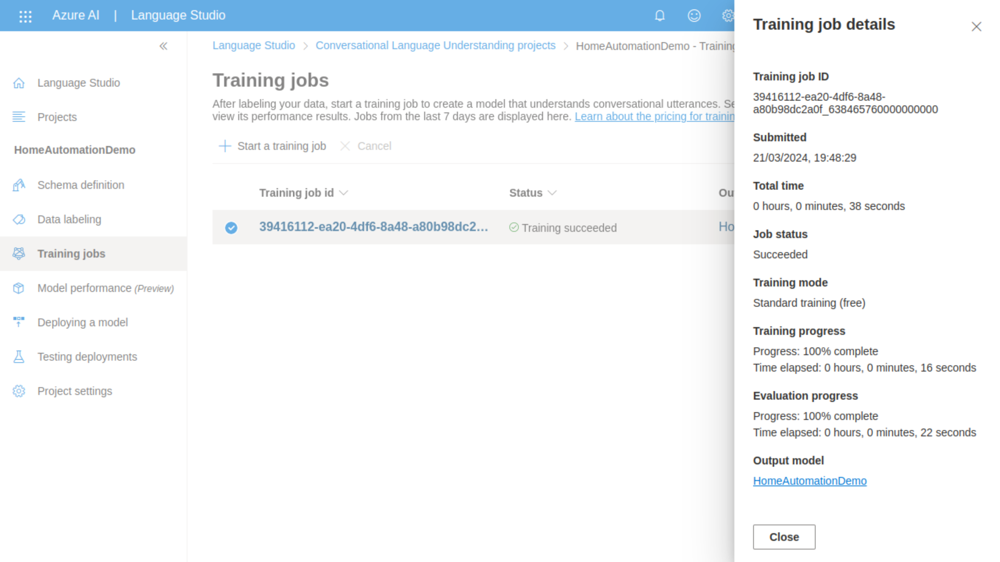

In [ ]:
img('clu13.png')

## View the performance by clicking on the Model Performance tab on the left. You can toggle between Intents and Entities using the Model Type dropdown, to see the performance of each.

## Moving from left to right at the top, we see that the performance is segregated into several outputs:
  1. Overview
  2. Model Performance
  3. Test set Details
  4. Dataset Distribution
  5. Confusion Matrix

## We will discuss the output in each of these tabs, and how to interpret the metrics.

## Understanding Model Evaluation

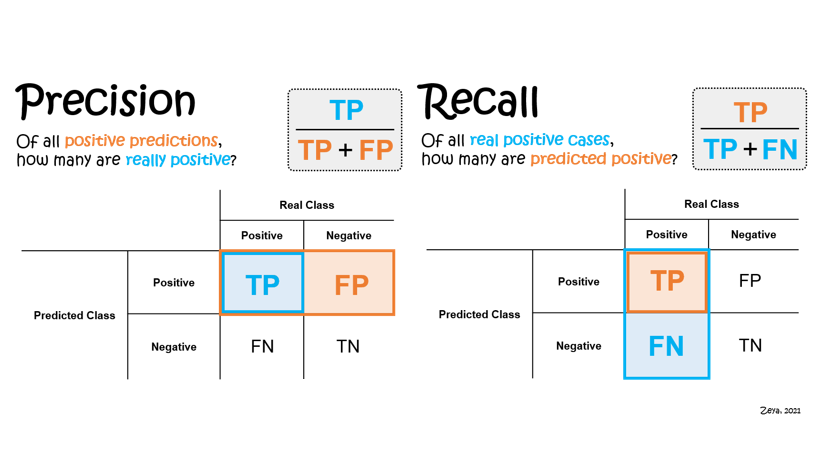

In [ ]:
img('metrics.png')

### Model evaluation metrics:

**Precision:** Measures how precise/accurate your model is. It's the ratio between the correctly identified positives (true positives) and all identified positives. The precision metric reveals how many of the predicted classes are correctly labeled.

**Precision = #True_Positive / (#True_Positive + #False_Positive)**

**Recall:** Measures the model's ability to predict actual positive classes. It's the ratio between the predicted true positives and what was actually tagged. The recall metric reveals how many of the predicted classes are correct.

**Recall = #True_Positive / (#True_Positive + #False_Negatives)**

**F1 score:** The F1 score is a function of Precision and Recall. It's needed when you seek a balance between Precision and Recall.

**F1 Score = 2 * Precision * Recall / (Precision + Recall)**

Precision, recall, and F1 score are calculated for:

Each entity separately (entity-level evaluation)<br>
Each intent separately (intent-level evaluation)<br>
For the model collectively (model-level evaluation).

Reference: https://learn.microsoft.com/en-gb/azure/ai-services/language-service/conversational-language-understanding/concepts/evaluation-metrics

For example, the model has analysed the following utterances:
1. are the back entryway lights on
2. what is my playroom switch set to
3. turn on the nightlight
4. the vacuum cleaner off

These are the intents used:
1. HomeAutomation.TurnOff
2. HomeAutomation.TurnOn
3. None

These are the entities that have been labelled in our train dataset:
1. HomeAutomation.Location


The model has made the following predictions:

| Utterance number | Utterance                             | Predicted intent       | Actual intent          | Predicted entity                            | Actual entity (Labelled)                             |
|------------------|---------------------------------------|------------------------|------------------------|---------------------------------------------|--------------------------------------------|
| 1                | are the back entryway lights on       | None                   | None                   | back entryway as HomeAutomation.Location    | back entryway as HomeAutomation.Location   |
| 1                | are the back entryway lights on       | None                   | None                   | lights as HomeAutomation.DeviceType         | --                                         |
| 2                | what is my playroom switch set to     | None                   | None                   | playroom as HomeAutomation.Location         | playroom as HomeAutomation.Location        |
| 3                | turn on the nightlight                | HomeAutomation.TurnOn  | HomeAutomation.TurnOn  | nightlight as HomeAutomation.DeviceType     | --                                         |
| 4                | the vacuum cleaner off                | HomeAutomation.TurnOff | HomeAutomation.TurnOff | vacuum cleaner as HomeAutomation.DeviceType | --                                         |
| 5                | switch on the lamp in nancy's bedroom | None                   | HomeAutomation.TurnOn  | lamp as HomeAutomation.DeviceType           | --                                         |
| 5                | switch on the lamp in nancy's bedroom | None                   | HomeAutomation.TurnOn  | None                                        | nancy's bedroom as HomeAutomation.Location |
| 5                | switch on the lamp in nancy's bedroom | None                   | HomeAutomation.TurnOn  | None                                        | bedroom as HomeAutomation.Location         |

## Intent level evaluation for HomeAutomation.TurnOff

| Key            | Count | Explanation                                                   |
|----------------|-------|---------------------------------------------------------------|
| True Positive  | 1     | Utterance 4 was correctly predicted as HomeAutomation.TurnOff |
| False Positive | 0     |                                                               |
| False Negative | 0     |                                                               |

Precision = #True_Positive / (#True_Positive + #False_Positive) = 1 / (1 + 0) = 1.0

Recall = #True_Positive / (#True_Positive + #False_Negatives) = 1 / (1 + 0) = 1.0

F1 Score = 2 * Precision * Recall / (Precision + Recall) = (2 * 1 * 1) / (1 + 1) = 1.0

## Intent level evaluation for HomeAutomation.TurnOn

| Key            | Count | Explanation                                                  |
|----------------|-------|--------------------------------------------------------------|
| True Positive  | 1     | Utterance 3 was correctly predicted as HomeAutomation.TurnOn |
| False Positive | 0     |                                                              |
| False Negative | 1     | Utterance 5 was not predicted as HomeAutomation.TurnOn       |

Precision = #True_Positive / (#True_Positive + #False_Positive) = 1 / (1 + 0) = 1.0

Recall = #True_Positive / (#True_Positive + #False_Negatives) = 1 / (1 + 1) = 0.5

F1 Score = 2 * Precision * Recall / (Precision + Recall) = (2 * 0.5 * 0.5) / (0.5 + 0.5) = 0.5

## Entity level evaluation for HomeAutomation.Location

| Key            | Count | Explanation                                                                                                        |
|----------------|-------|--------------------------------------------------------------------------------------------------------------------|
| True Positive  | 2     | Back entryway and playroom in utterances 1 and 2 were correctly predicted as HomeAutomation.Location respectively. |
| False Positive | 0     |                                                                                                                    |
| False Negative | 2     | Nancy's bedroom and bedroom utterance 5 were not predicted as HomeAutomation.Location                              |

Precision = #True_Positive / (#True_Positive + #False_Positive) = 2 / (2 + 0) = 1.0

Recall = #True_Positive / (#True_Positive + #False_Negatives) = 2 / (2 + 2) = 0.5

F1 Score = 2 * Precision * Recall / (Precision + Recall) = (2 * 1.0 * 0.5) / (1.0 + 0.5) = 0.67

## Entity level evaluation for HomeAutomation.DeviceType

| Key            | Count | Explanation                                                                                                                            |
|----------------|-------|----------------------------------------------------------------------------------------------------------------------------------------|
| True Positive  | 0     |                                                                                                                                        |
| False Positive | 4     | Lights, nightlight, vacuum cleaner, lamp were incorrectly predicted as HomeAutomation.DeviceType in utterances 1, 3, 4, 5 respectively |
| False Negative | 0     |                                                                                                                                        |

Precision = #True_Positive / (#True_Positive + #False_Positive) = 0 / (0 + 4) = 0.0

Recall = #True_Positive / (#True_Positive + #False_Negatives) = 0 / (0 + 0) = 0.0

F1 Score = 2 * Precision * Recall / (Precision + Recall) = (2 * 0.0 * 0.0) / (0.0 + 0.0) = 0.0

## Model-level evaluation for the collective model

| Key            | Count | Explanation                            |
|----------------|-------|----------------------------------------|
| True Positive  | 4     | Sum of TP for all intents and entities |
| False Positive | 4     | Sum of FP for all intents and entities |
| False Negative | 3     | Sum of FN for all intents and entities |

Precision = #True_Positive / (#True_Positive + #False_Positive) = 4 / (4 + 4) = 0.5

Recall = #True_Positive / (#True_Positive + #False_Negatives) = 4 / (4 + 3) = 0.57

F1 Score = 2 * Precision * Recall / (Precision + Recall) = (2 * 0.5 * 0.57) / (0.5 + 0.57) = 0.53

## Finally, we can arrange the combinations of true positive, true negative, false positive and false negative values in a matrix called the confusion matrix. Here is a quick recap:

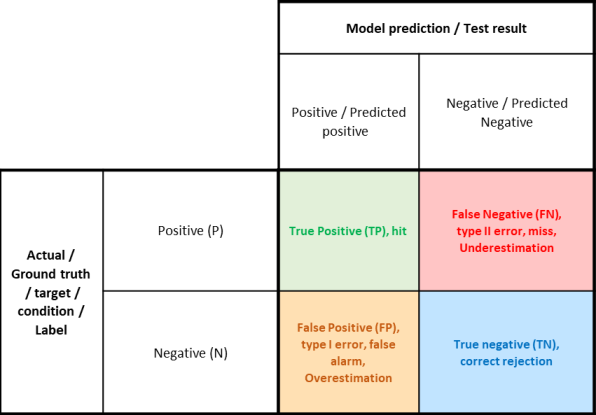

In [ ]:
img('metrics2.png')

# Analyzing the metrics for the model:
## 1. Overview
## This shows a bird's eye view of how well the model was able to classify the intents and entities.
### We can see the number of training and testing utterances. As we had selected the default split, the ratio is 80:20 for train and test respectively.
### Next, we can see the F1 score, precision and recall.

## 1. Overview - a. Intents:

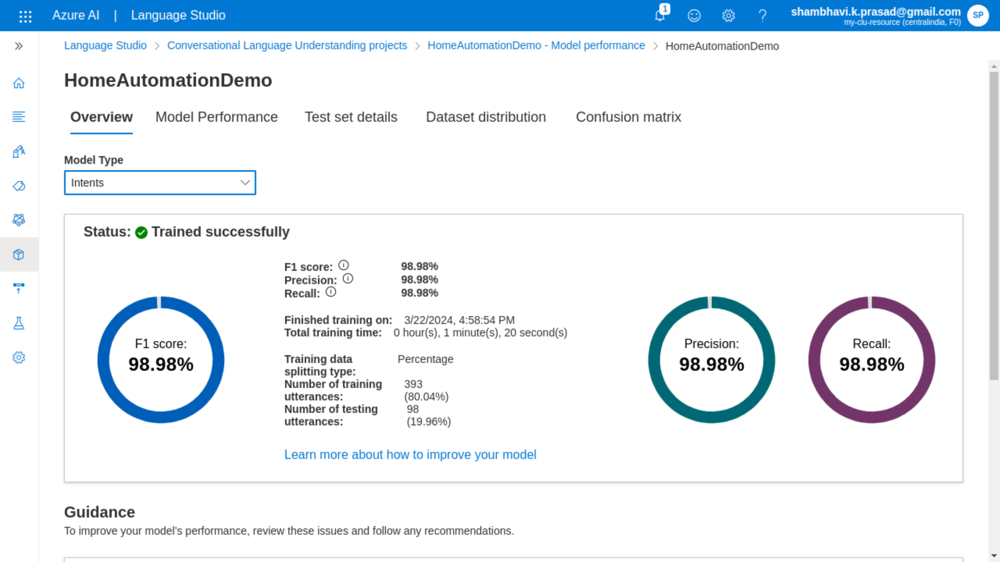

In [ ]:
img('01.png')

## Inference: The model has performed very well in predicting the intents. The values for precision, recall and F1 score are all 98.98%

## 1. Overview - b. Entities:

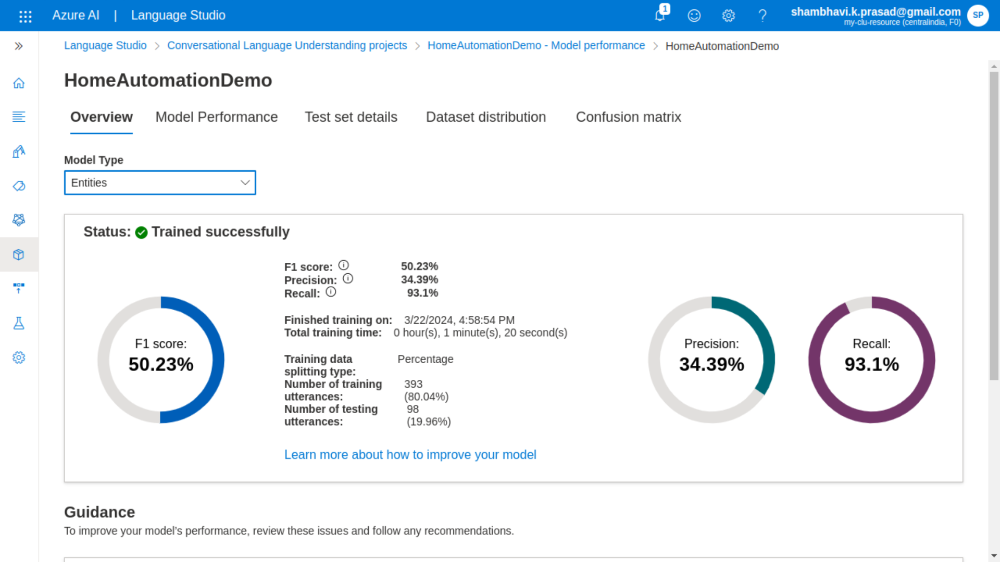

In [ ]:
img('02.png')

## Compared to the intents, the model has perfomed poorly on predicting the entities. Whereas recall is excellent at 93.1%, the precision is 34.39%. This causes the F1 score to become 50.23%, as it is the harmonic mean of precision and recall.

## 2. Model Performance - a. Intents

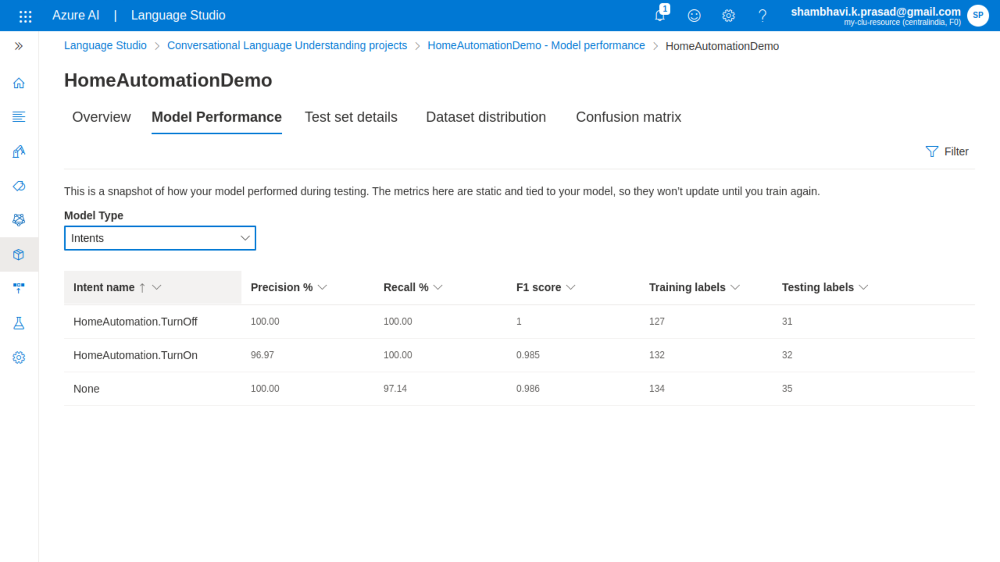

In [ ]:
img('03.png')

## Inference: The model is performing well on predicting the three intents.

## 2. Model Performance - b. Entities

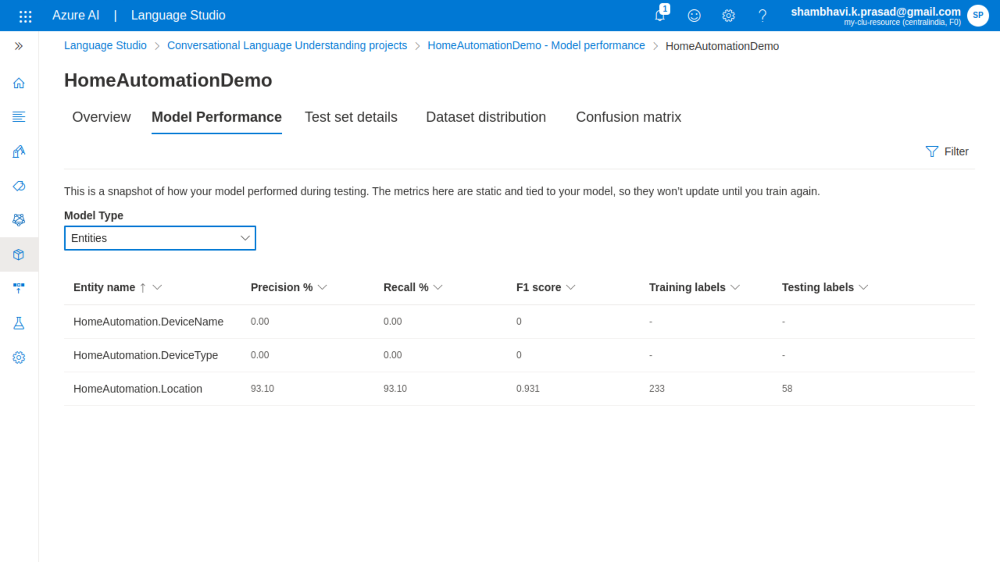

In [ ]:
img('04.png')

## Inference: The model is not performing well on predicting the entities. This is because we have not labelled two entities, DeviceName and DeviceType, in our utterances. So, even if it correctly predicted these entities, it is being identified as a false positive.

## On the other hand, the Location entity has been labelled, and correctly identified for a majority of the cases. As shown previously, the F1 score is 93.1% for this entity.

## 3. Dataset Distribution - a. Intents

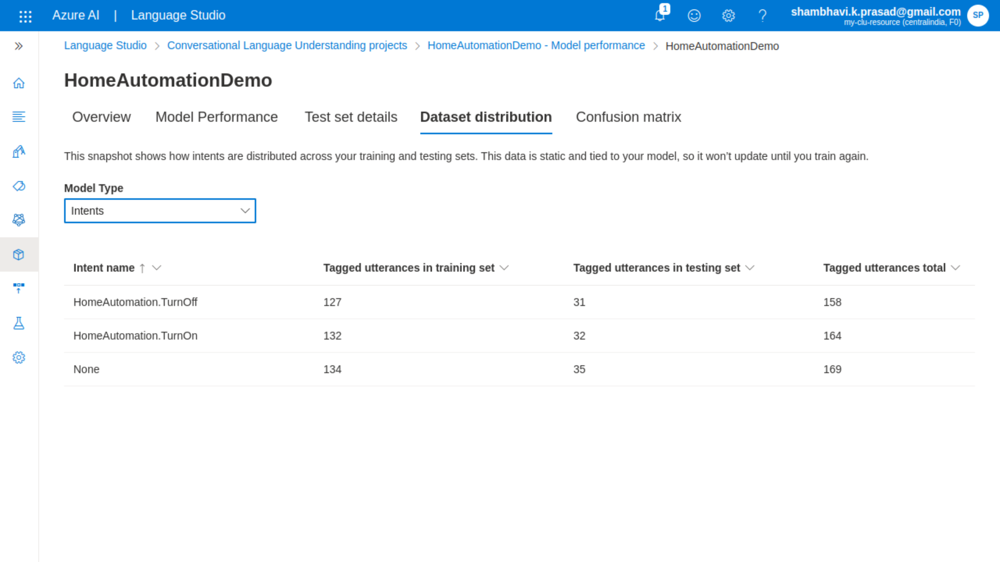

In [ ]:
img('06.png')

## Here, we can see that the dataset was nearly equally divided among the three intents, with NoneType having the highest tagged utterances.

## 3. Dataset Distribution - b. Entities

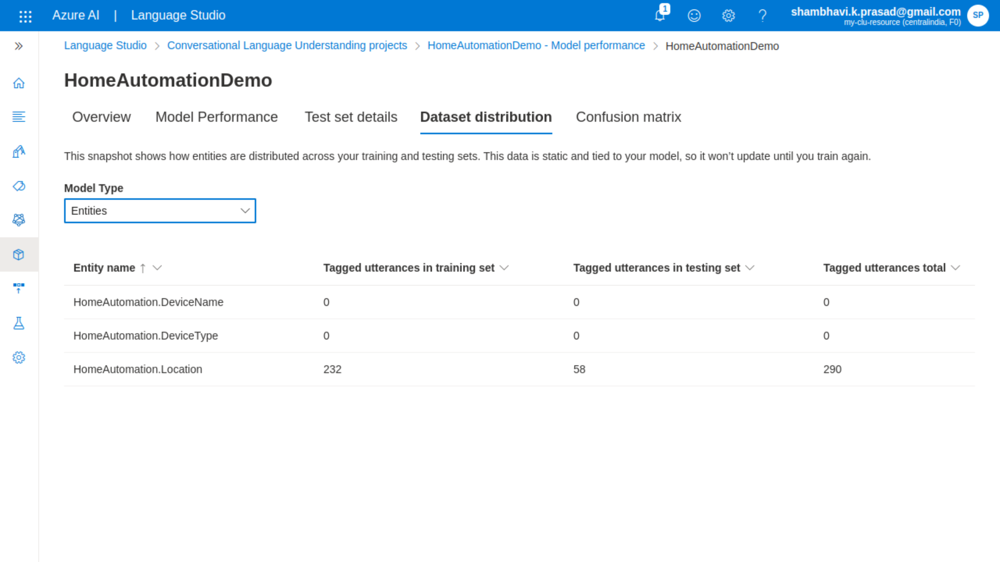

In [ ]:
img('07.png')

## Here, we can see that the in all the utterances in the dataset, only one entity was tagged, namely, Location. The other two entities have not been tagged, which explains the poor performance of the model in terms of the entitites.

## 4. Test set details

## This shows the tagged labels and the predictions made by the model. You can toggle between seeing the predicted labels and the actual labels, by clicking the 'showing entity labels' button at the top.

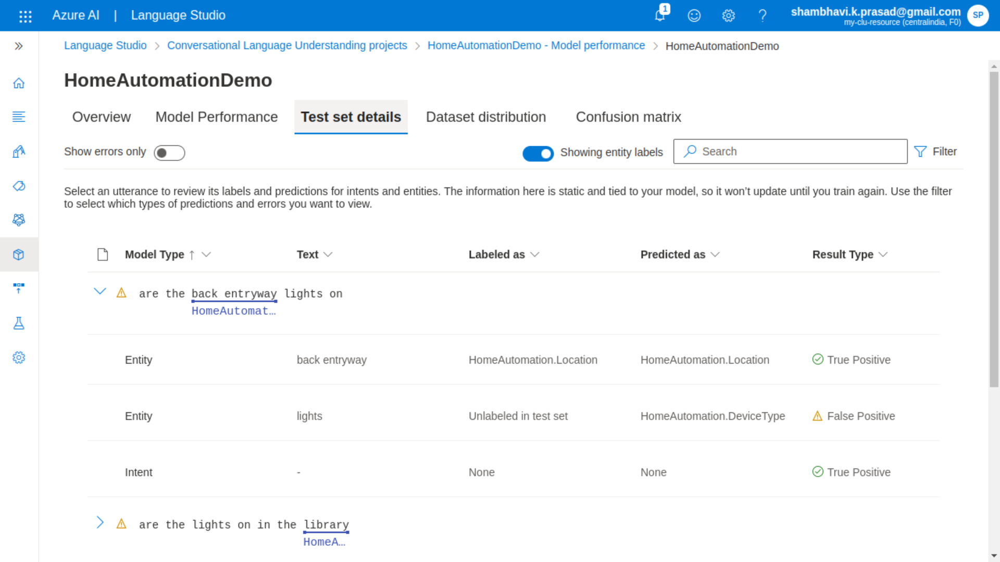

In [ ]:
img('05.png')

## Here, we can see the results of the test set, i.e. which intents and entities have been identified in the test set and whether the prediction is a true positive, a false positive or a false negative.

## 5. Confusion Matrix - a. Intents

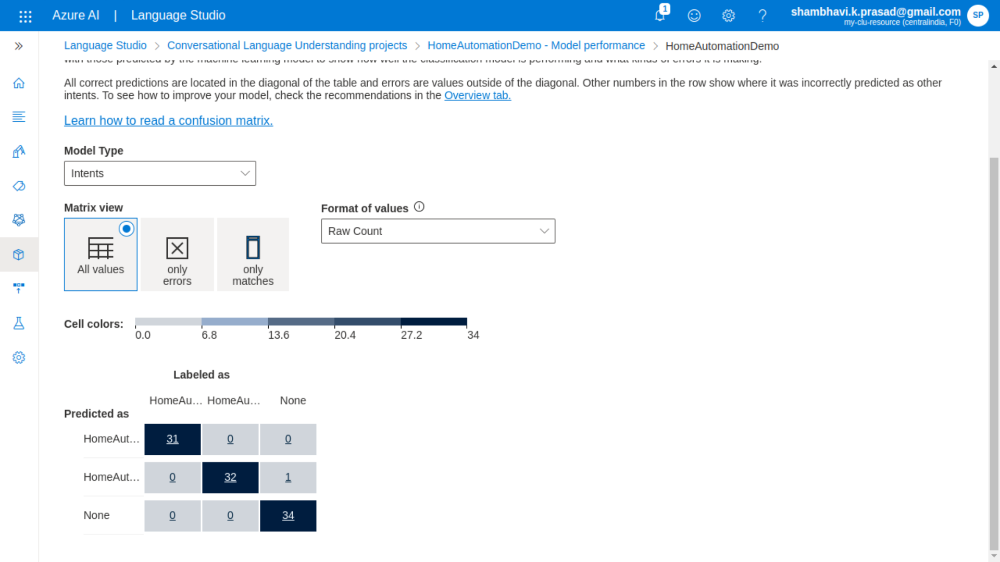

In [ ]:
img('08.png')

## We can see the confusion matrix for the intents here.

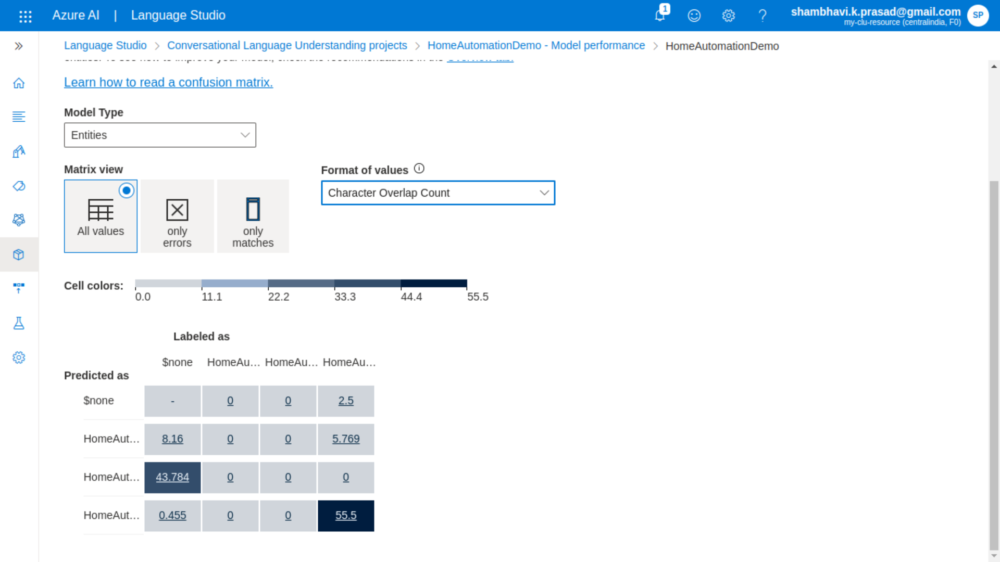

In [ ]:
img('09.png')

# Model Deployment
## Once you are satisfied with the training, you can deploy the model.

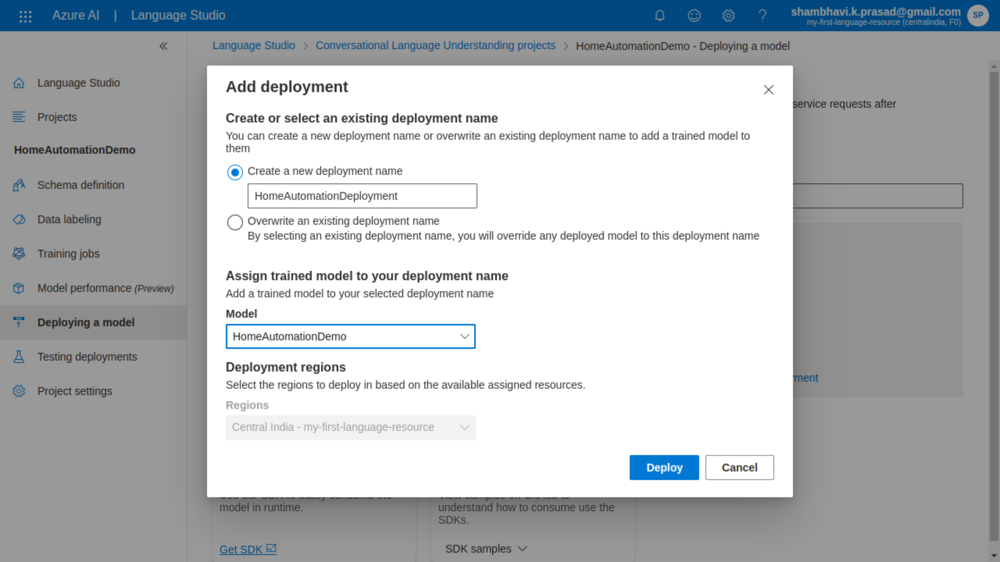

In [ ]:
img('clu24.png')

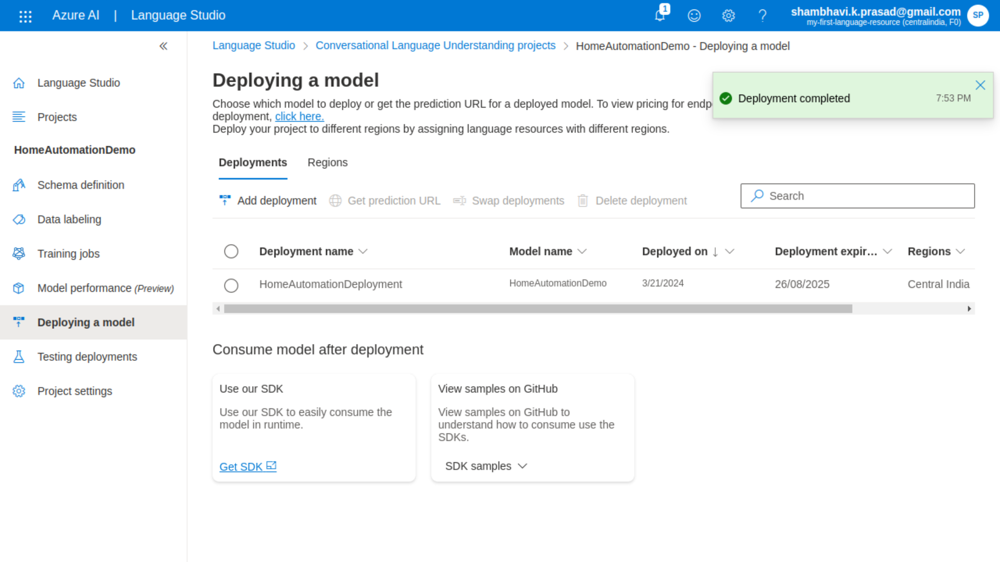

In [ ]:
img('clu25.png')

# Consume the deployed model. You can consume the model using either the UI or using SDK. Here, we will learn how can we consume it using the Python SDK.

In [ ]:
# get secrets
load_dotenv()
clu_endpoint = os.environ["AZURE_CONVERSATIONS_ENDPOINT"]
clu_key = os.environ["AZURE_CONVERSATIONS_KEY"]
deployment_name = "HomeAutomationDeployment"
project_name= "HomeAutomationDemo"

# analyze quey
client = ConversationAnalysisClient(clu_endpoint, AzureKeyCredential(clu_key))

with client:
    query = "Turn on the lights at the staircase please."
    result = client.analyze_conversation(
        task={
            "kind": "Conversation",
            "analysisInput": {
                "conversationItem": {
                    "participantId": "1",
                    "id": "1",
                    "modality": "text",
                    "language": "en",
                    "text": query
                },
                "isLoggingEnabled": False
            },
            "parameters": {
                "projectName": project_name,
                "deploymentName": deployment_name,
                "verbose": True
            }
        }
    )

# view result
print("query: {}".format(result["result"]["query"]))
print("project kind: {}\n".format(result["result"]["prediction"]["projectKind"]))

print("top intent: {}".format(result["result"]["prediction"]["topIntent"]))
print("category: {}".format(result["result"]["prediction"]["intents"][0]["category"]))
print("confidence score: {}\n".format(result["result"]["prediction"]["intents"][0]["confidenceScore"]))

print("\nentities:")
for entity in result["result"]["prediction"]["entities"]:
    print("\ncategory: {}".format(entity["category"]))
    print("text: {}".format(entity["text"]))
    print("confidence score: {}".format(entity["confidenceScore"]))

    if "resolutions" in entity:
        print("\nresolutions")
        for resolution in entity["resolutions"]:
            print("kind: {}".format(resolution["resolutionKind"]))
            print("value: {}".format(resolution["value"]))

    if "extraInformation" in entity:
        print("\nextra info")
        for data in entity["extraInformation"]:
            print("kind: {}".format(data["extraInformationKind"]))
            if data["extraInformationKind"] == "ListKey":
                print("key: {}".format(data["key"]))
            if data["extraInformationKind"] == "EntitySubtype":
                print("value: {}".format(data["value"]))

query: Turn on the lights at the staircase please.
project kind: Conversation

top intent: HomeAutomation.TurnOn
category: HomeAutomation.TurnOn
confidence score: 0.88160664

entities:

category: HomeAutomation.DeviceType
text: lights
confidence score: 1
extra info
kind: ListKey
key: light

category: HomeAutomation.Location
text: staircase
confidence score: 1


# Closing the project - resource deletion

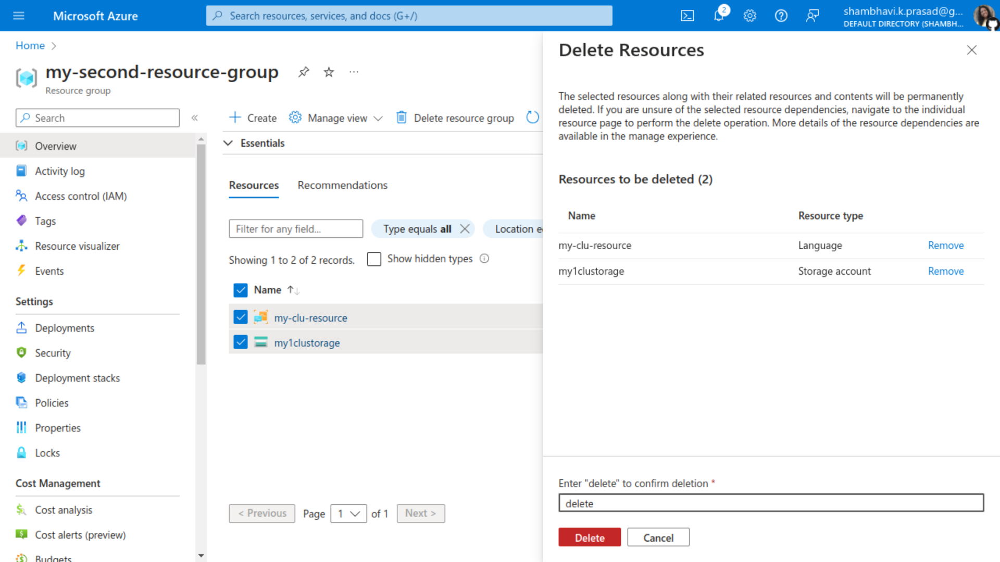

In [ ]:
img('del.png')